# Data Cleaned Readme, Spectograms Display

This notebook contains the information for the data cleaned manually by deleting the files inside the folders and the Spectograms for the files displayed in a grid.

In [21]:
# Importing the libraries 

import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, Audio

### Number of files and Species Cleaned 

In [18]:
def get_subfolder_details(parent_folder):
    # List all the items in the parent folder
    items = os.listdir(parent_folder)
    
    # Filter out only the subfolders
    subfolders = [item for item in items if os.path.isdir(os.path.join(parent_folder, item))]
    
    # Get the number of files in each subfolder
    file_counts = []
    for subfolder in subfolders:
        files = [f for f in os.listdir(os.path.join(parent_folder, subfolder)) if os.path.isfile(os.path.join(parent_folder, subfolder, f))]
        file_counts.append(len(files))
    
    # Create a pandas DataFrame
    df = pd.DataFrame({
        'Subfolder': subfolders,
        'Number of Files': file_counts
    })
    
    return df


In [19]:
parent_folder = r"C:\Users\athar\Downloads\AK_Files"
df = get_subfolder_details(parent_folder)
print(df)

                   Subfolder  Number of Files
0                  Dama Dama               39
1      Falcunculus frontatus               10
2                Felis Catus               44
3                Fulica atra               11
4        Gallinula tenebrosa               29
5        Gavicalis virescens              449
6  Symposiachrus trivirgatus               14


### Play some of the files in the subfolders

In [22]:
# Displaying the files to be played

# Specify the path to your folder containing audio files
audio_folder_path = r"C:\Users\athar\Downloads\AK_Files\Display"

# Iterate over all files in the folder
for audio_file in os.listdir(audio_folder_path):
    if audio_file.endswith(('.wav', '.mp3')):
        display(Audio(os.path.join(audio_folder_path, audio_file)))

In [2]:
# Defining the Constants

AUDIO_NFFT = 2048
AUDIO_WINDOW = None
AUDIO_STRIDE = 200
AUDIO_SAMPLE_RATE = 48000
AUDIO_MELS = 260
AUDIO_FMIN = 20
AUDIO_FMAX = 13000
AUDIO_TOP_DB = 80

In [23]:
def plot_mel_spectrograms_grid(root_folder, output_dir, grid_size=40):
    # List to store mel spectrograms
    mel_spectrograms = []
    
    # Extract mel spectrograms for all audio files
    for subdir, _, files in os.walk(root_folder):
        for file in files:
            if file.endswith(".mp3"):
                audio_path = os.path.join(subdir, file)
                y, sr = librosa.load(audio_path)
                mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr,
                                                    n_mels=AUDIO_MELS, hop_length=AUDIO_STRIDE, fmax=AUDIO_FMAX)
                mel_spectrograms.append(mel_spectrogram)
                if len(mel_spectrograms) == grid_size:  # Stop once we have enough for the grid
                    break
        if len(mel_spectrograms) == grid_size:
            break

    # Create a grid of mel spectrograms
    rows = int(np.sqrt(grid_size))
    cols = int(np.ceil(grid_size / rows))
    
    fig, axs = plt.subplots(rows, cols, figsize=(15, 15))
    
    for i, ax in enumerate(axs.ravel()):
        if i < len(mel_spectrograms):
            mel = mel_spectrograms[i]
            librosa.display.specshow(librosa.power_to_db(mel, ref=np.max), hop_length=128, fmax=8000, ax=ax)
            ax.axis("off")
        else:
            ax.axis("off")
    
    grid_output_path = os.path.join(output_dir, "mel_spectrograms_grid.png")
    plt.tight_layout()
    plt.savefig(grid_output_path, bbox_inches='tight', pad_inches=0)
    plt.show()

## Felis Catus

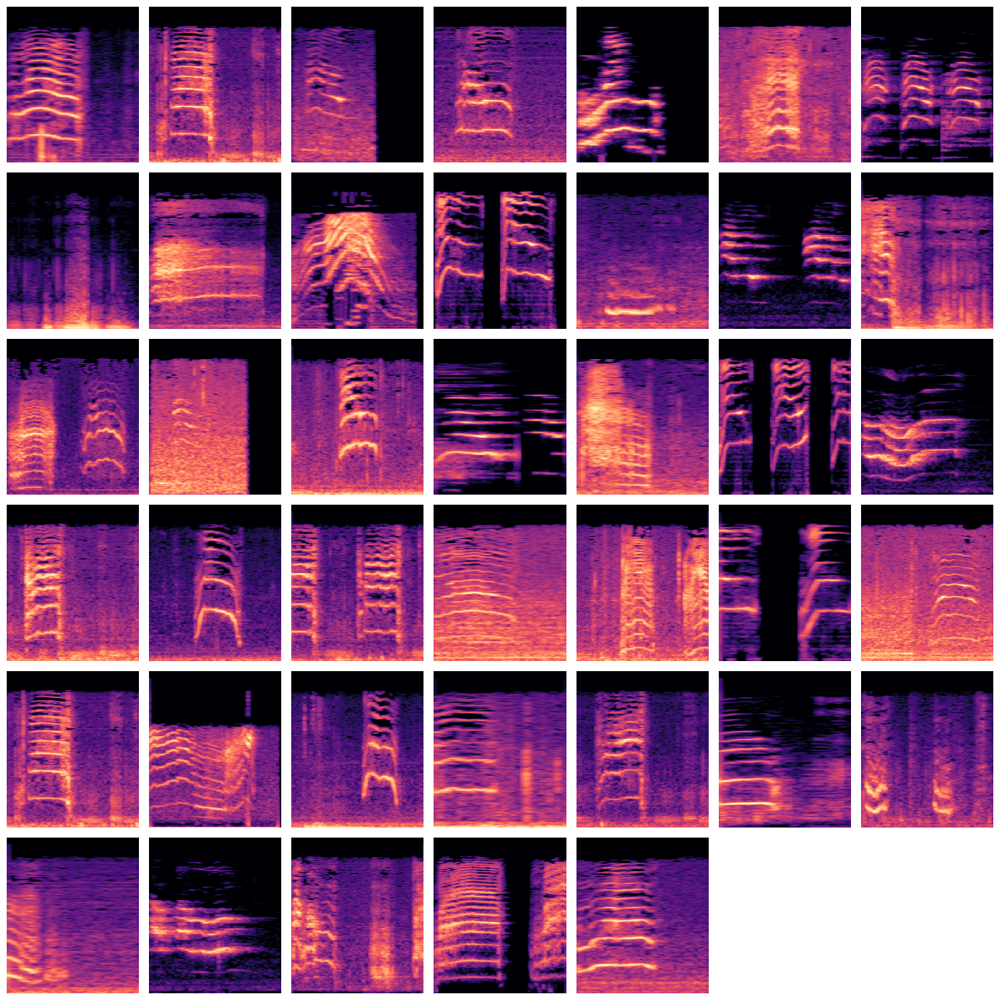

In [5]:
# Process the audio files in the "Audio_Folder" and save the grid to "Cluster_Directory"
plot_mel_spectrograms_grid(root_folder, output_dir)

## Fulica Atra

In [6]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Fulica atra"
output_dir = "Cluster_Directory1"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

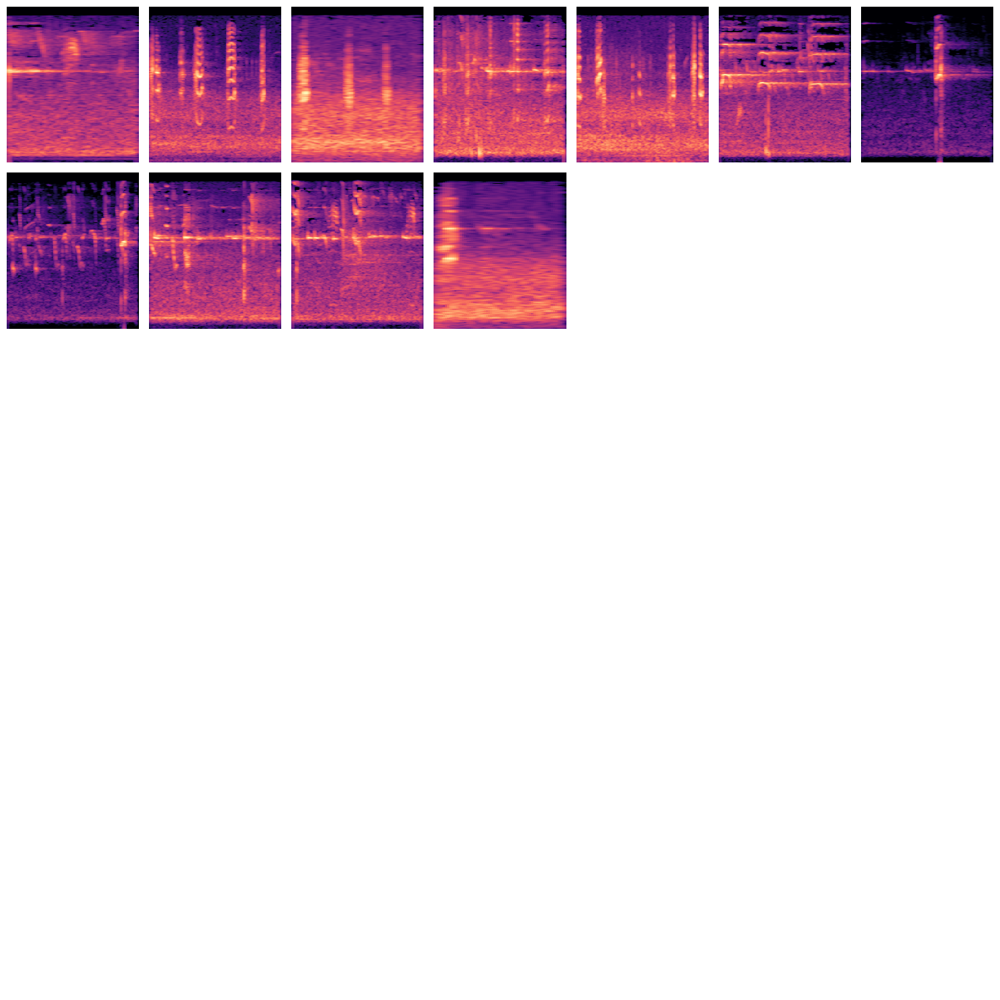

In [7]:
# Process the audio files in the "Audio_Folder" and save the grid to "Cluster_Directory"
plot_mel_spectrograms_grid(root_folder, output_dir)

## Gallinula Tenebrosa

In [8]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Gallinula tenebrosa"
output_dir = "Cluster_Directory3"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

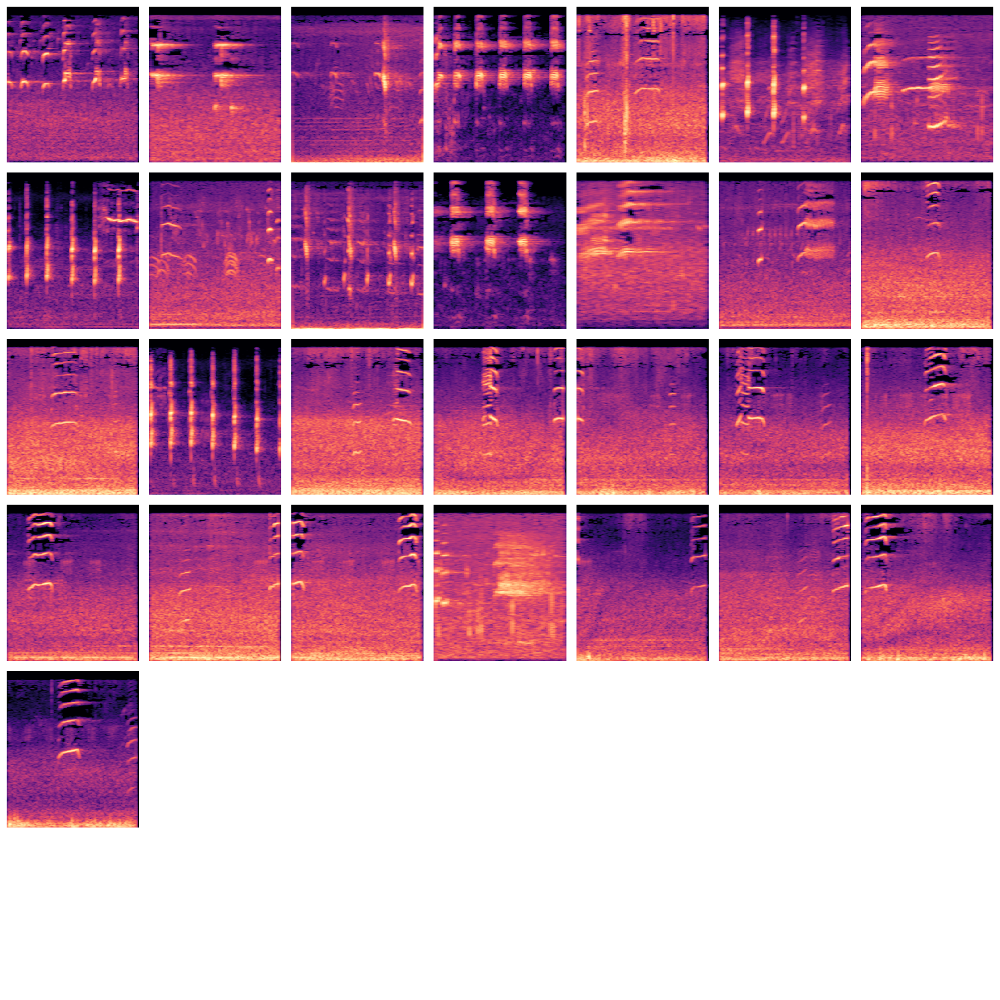

In [9]:
# Process the audio files in the "Audio_Folder" and save the grid to directory
plot_mel_spectrograms_grid(root_folder, output_dir)

## Symosiachrus Trivigatus

In [10]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Symposiachrus trivirgatus"
output_dir = "Cluster_Directory4"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

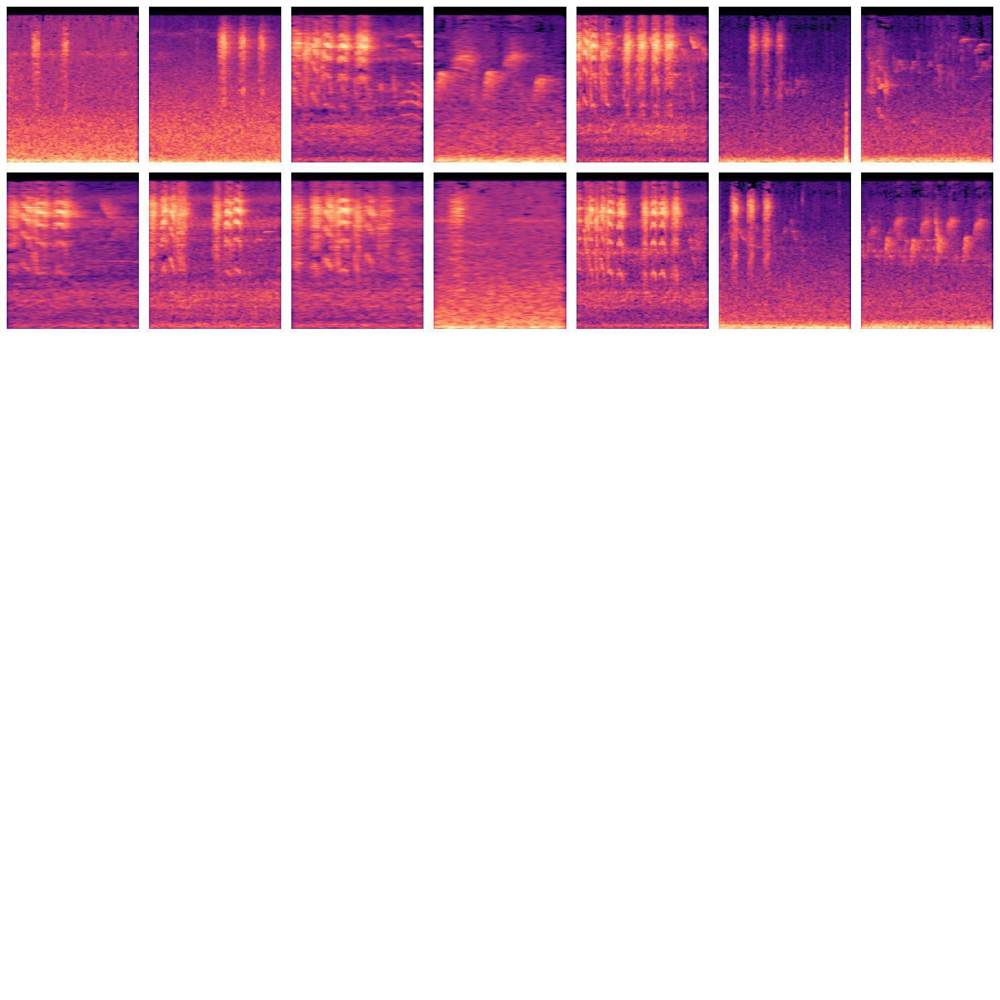

In [11]:
# Process the audio files in the "Audio_Folder" and save the grid to directory
plot_mel_spectrograms_grid(root_folder, output_dir)

## Dama Dama

In [12]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Dama Dama"
output_dir = "Cluster_Directory5"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

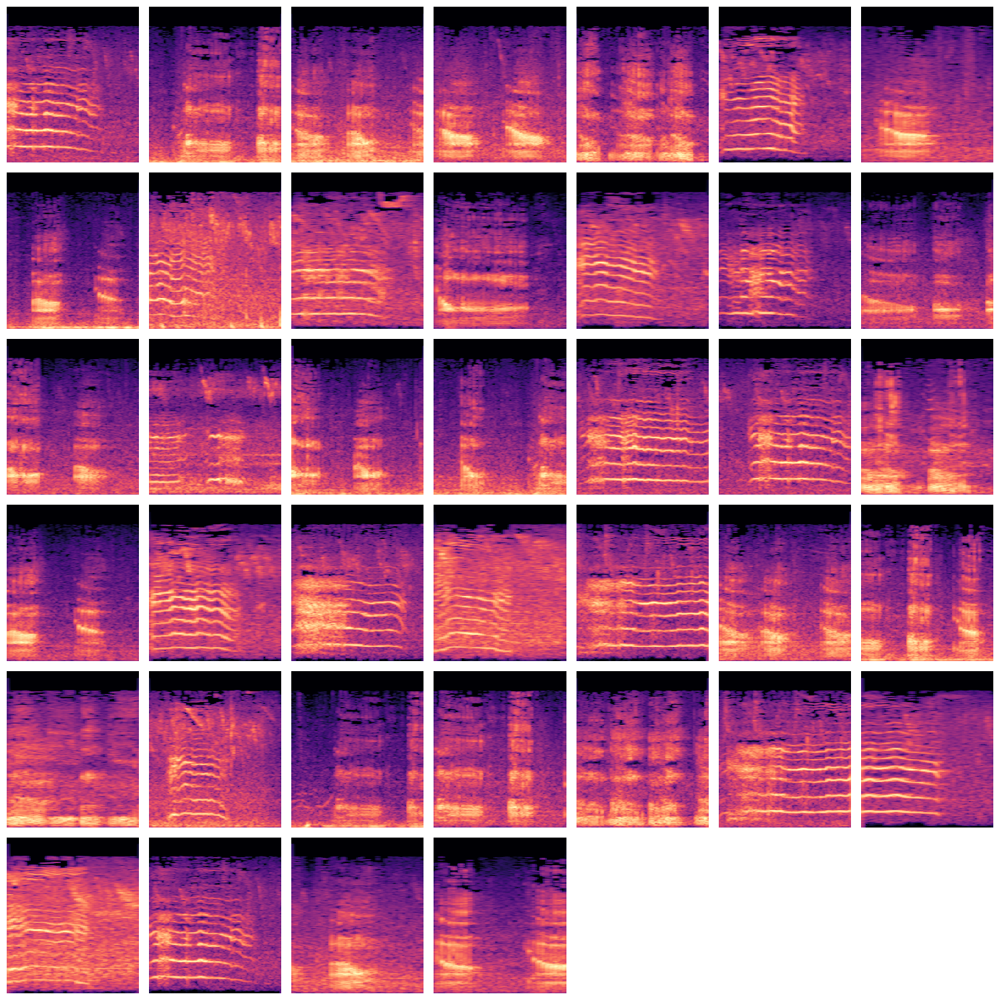

In [13]:
# Process the audio files in the "Audio_Folder" and save the grid to directory
plot_mel_spectrograms_grid(root_folder, output_dir)

## Falcunculus Frontatus

In [14]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Falcunculus frontatus"
output_dir = "Cluster_Directory5"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

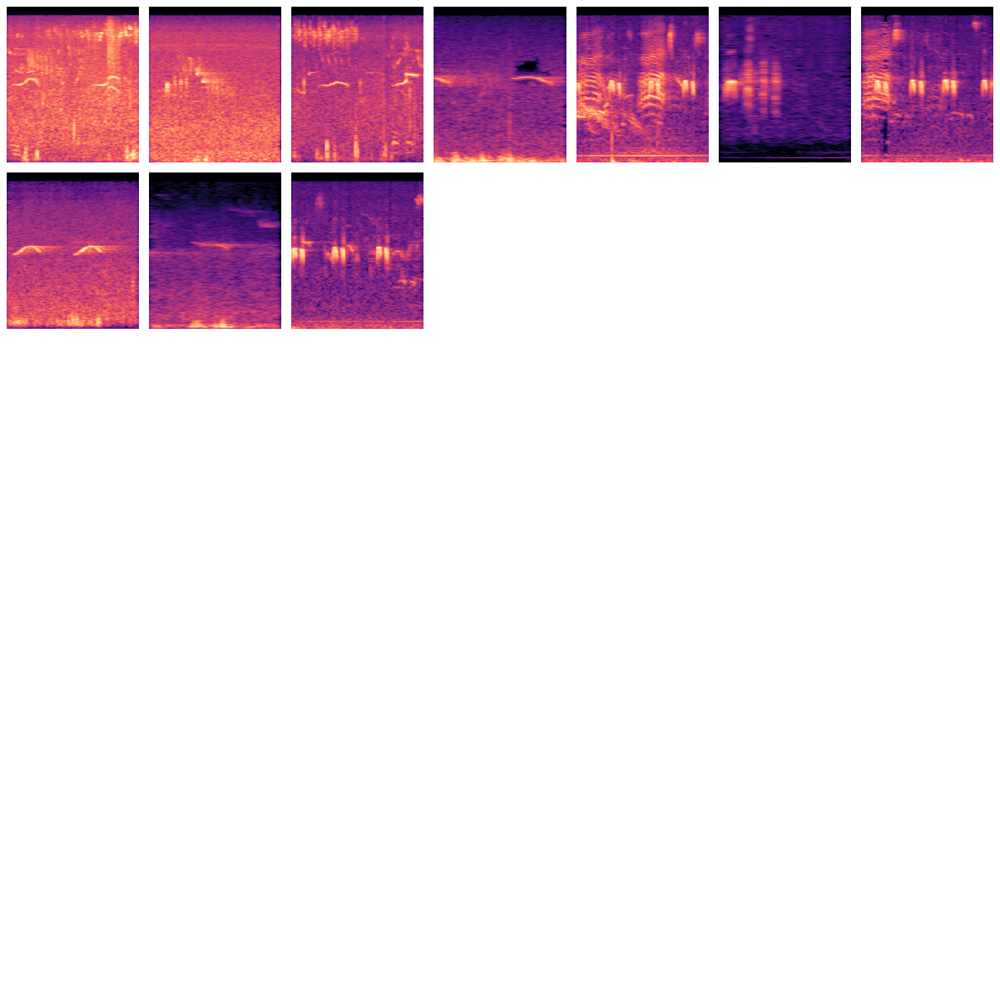

In [15]:
# Process the audio files in the "Audio_Folder" and save the grid to directory
plot_mel_spectrograms_grid(root_folder, output_dir)

## Gavicalis Virescens

In [16]:
root_folder = r"C:\Users\athar\Downloads\AK_Files\Gavicalis virescens"
output_dir = "Cluster_Directory6"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

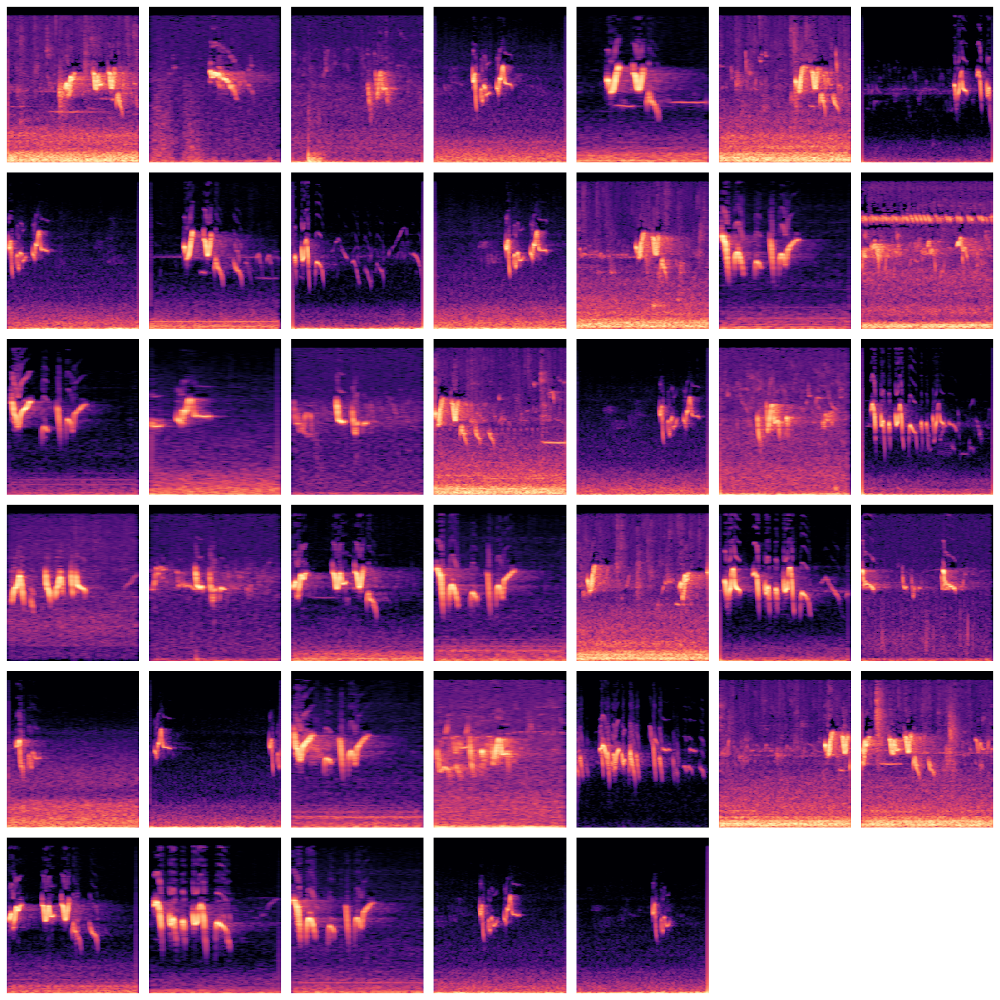

In [17]:
# Process the audio files in the "Audio_Folder" and save the grid to directory
plot_mel_spectrograms_grid(root_folder, output_dir)